# 이미지 증강
### 텐서플로우를 사용한 Image Augmentation

In [1]:
# 라이브러리
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import os

2024-07-02 03:35:42.497253: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-02 03:35:46.889357: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [4]:
# 데이터 불러오기       
sample_img_path = './mycat.jpg'
sample_img_path

'./mycat.jpg'

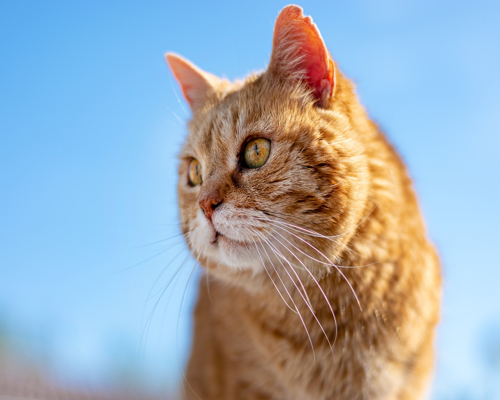

In [5]:
# 크기 변경
image = Image.open(sample_img_path).resize((500, 400)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

image

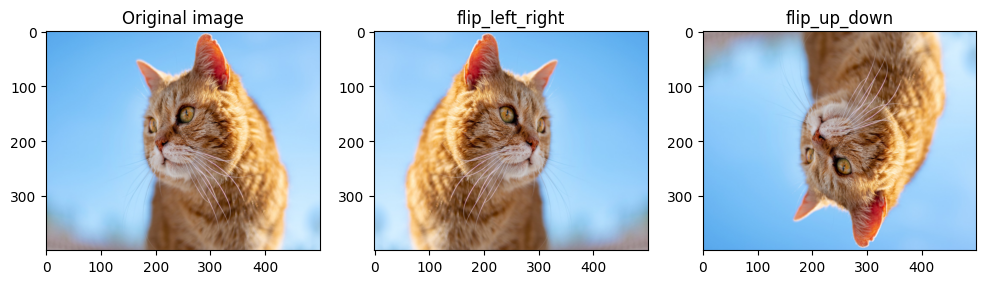

In [7]:
# FLIP
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

plt.figure(figsize=(12, 12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

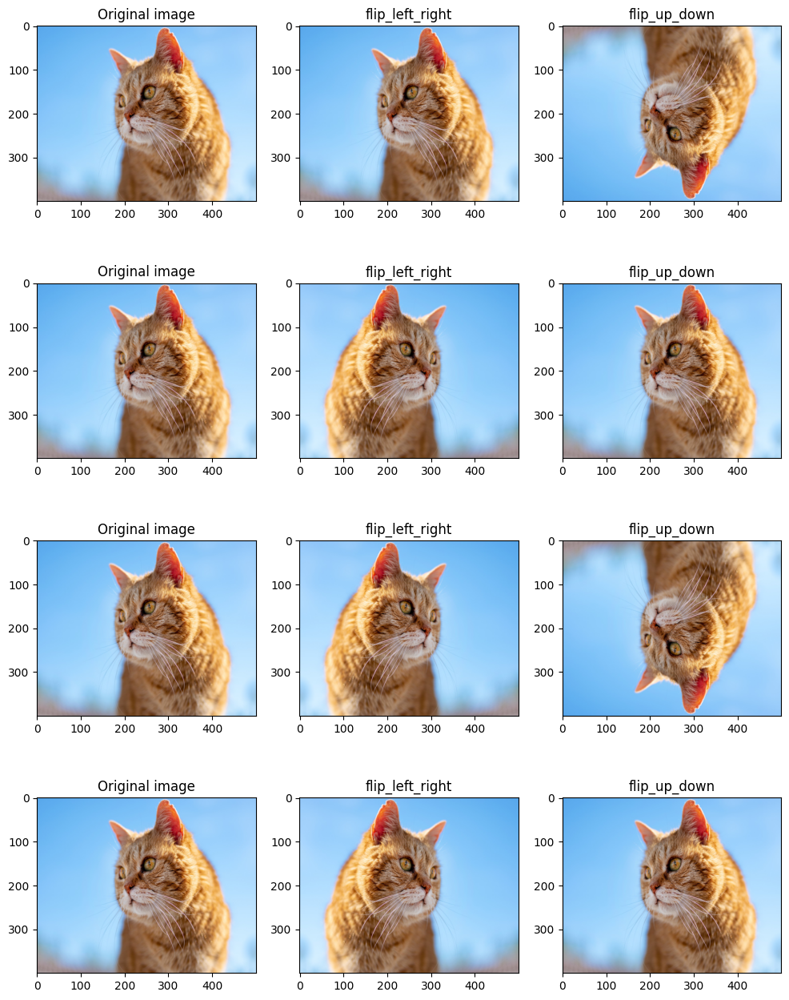

In [8]:
# 랜덤 확률로 flip을 함
# 이렇게 하면, epoch 학습할 때마다 다른 이미지를 학습하게 됨
plt.figure(figsize=(12, 16))

row = 4
for i in range(row):
    flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
    flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
    flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
    flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)
    
    plt.subplot(4,3,i*3+1)
    plt.title('Original image')
    plt.imshow(image)

    plt.subplot(4,3,i*3+2)
    plt.title('flip_left_right')
    plt.imshow(flip_lr_image)

    plt.subplot(4,3,i*3+3)
    plt.title('flip_up_down')
    plt.imshow(flip_ud_image)

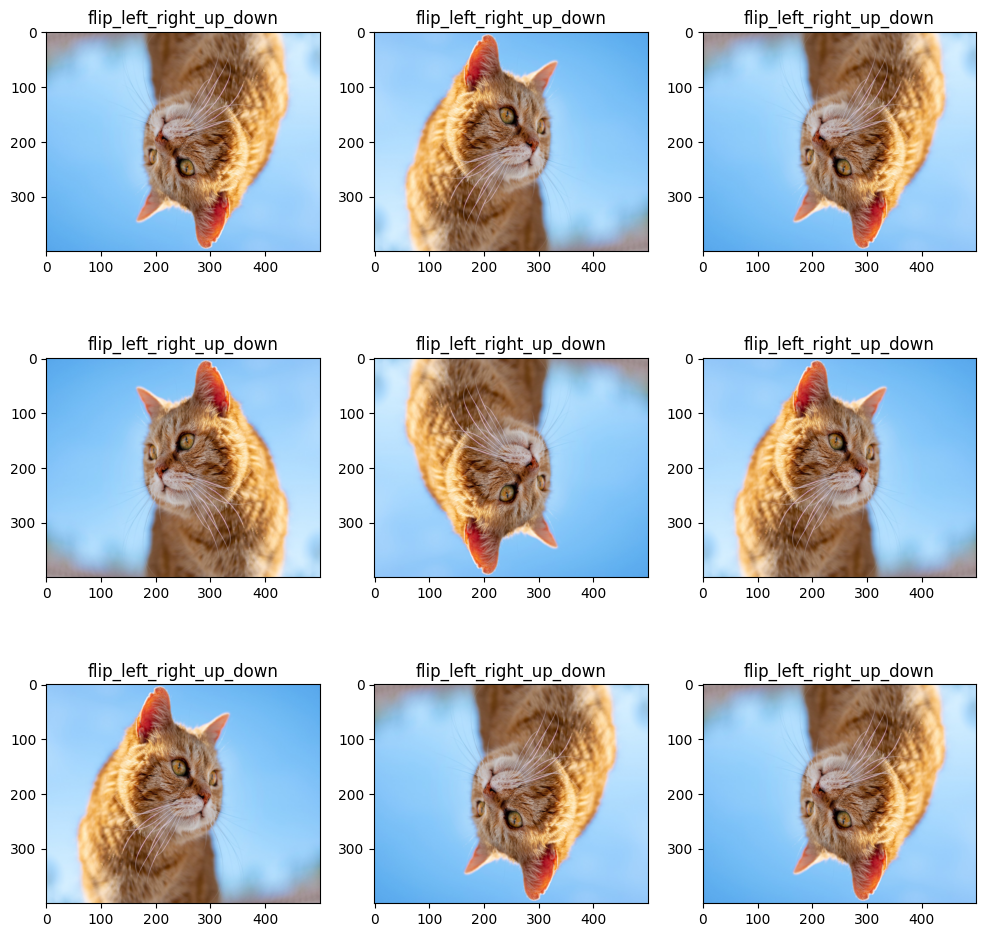

In [9]:
# Q. random_flip 을 구현하세요.

def random_flip(image_tensor):
    flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
    flip_ud_tensor = tf.image.random_flip_up_down(flip_lr_tensor)
    flip_ud_lr_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)
    return flip_ud_lr_image

plt.figure(figsize=(12, 12))

num = 9
for i in range(num):
    plt.subplot(3,3,i+1)
    plt.title('flip_left_right_up_down')
    plt.imshow(random_flip(image_tensor))

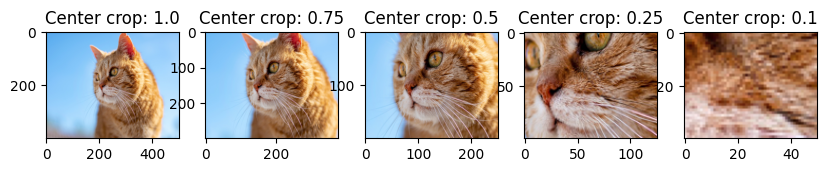

In [10]:
# centor crop = 중앙을 기준으로 자른 이미지를 사용
# central_fraction은 얼마나 확대를 할지를 조절하는 매개변수, 0~1, 숫자가 작을수록 확대가 많이 됨
# 너무 확대하면 원본 이미지의 의미를 잃어버릴 수 있음

plt.figure(figsize=(12, 15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
    cropped_tensor = tf.image.central_crop(image_tensor, frac)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.title(f'Center crop: {frac}')
    plt.imshow(cropped_img)



In [11]:
# random crop
def random_central_crop(image_tensor, range=(0, 1)):
    # range 범위에서 무작위로 잘라낼 비율을 선택합니다
    central_fraction = tf.random.uniform([1], minval=range[0], maxval=range[1], dtype=tf.float32)
    cropped_tensor = tf.image.central_crop(image_tensor, central_fraction)
    return cropped_tensor

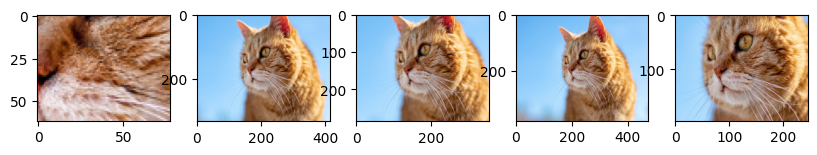

In [12]:
plt.figure(figsize=(12, 15))

col = 5
for i in range(col):
    cropped_tensor = random_central_crop(image_tensor)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.imshow(cropped_img)

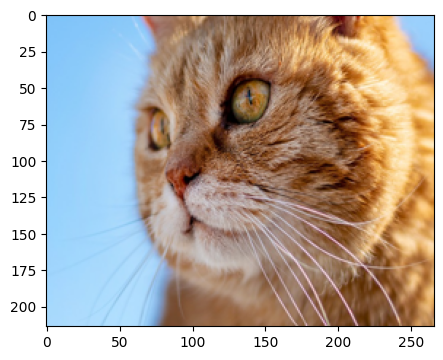

In [18]:
# apply random_crop on cat image 
plt.figure(figsize=(5, 5))

random_crop_tensor = random_central_crop(image_tensor)
random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()

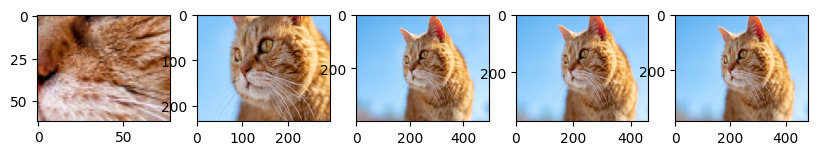

In [20]:
# display 5 random cropped images

plt.figure(figsize=(12, 15))

for i in range(5):
  random_crop_tensor = random_central_crop(image_tensor)
  random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)

  plt.subplot(1,col+1,i+1)
  plt.imshow(random_crop_image)

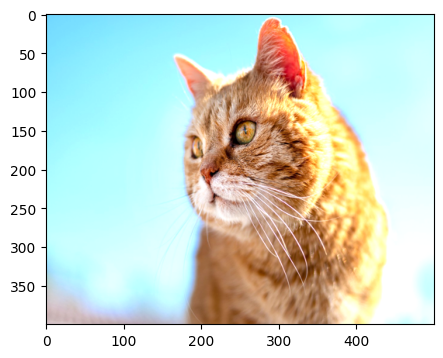

In [22]:
# brightness
# 밝기 조절
plt.figure(figsize=(5, 5))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=64)# 값이 0~255 를 벗어날 수도 있는 듯 
cliped_random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255) 
random_bright_image = tf.keras.preprocessing.image.array_to_img(cliped_random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

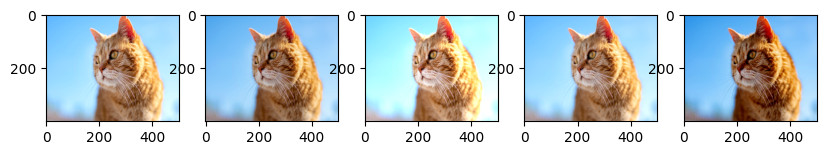

In [23]:
# display 5 random brightness images

plt.figure(figsize=(12, 15))

col = 5
for i in range(5):
    random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=64)
    cliped_random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255) 
    random_bright_image = tf.keras.preprocessing.image.array_to_img(cliped_random_bright_tensor)

    plt.subplot(1,col+1,i+1)
    plt.imshow(random_bright_image)

# albumentations 라이브러리 
### augmentation만 전문적으로 하는 라이브러리

In [24]:
# 배열을 이미지의 기본 형태로 사용함
import numpy as np
image = Image.open(sample_img_path).resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

In [25]:
def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)

<Figure size 3000x300 with 0 Axes>

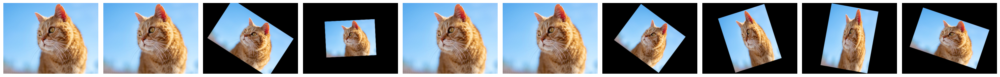

In [34]:
# Affine 변환
import albumentations as A
import cv2

plt.figure(figsize=(30, 3))
col = 10
# 1행 10열의 서브플롯 생성
fig, axes = plt.subplots(1, col, figsize=(30, 3))

for i in range(10):
    transform = A.Compose([
        A.Affine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5) 
    ])
    transformed = transform(image=image_arr)
    
    # 서브플롯에 이미지 배치
    axes[i].imshow(transformed['image'])
    axes[i].axis('off')  # 축을 표시하지 않음

plt.tight_layout()
plt.show()


<Figure size 3000x300 with 0 Axes>

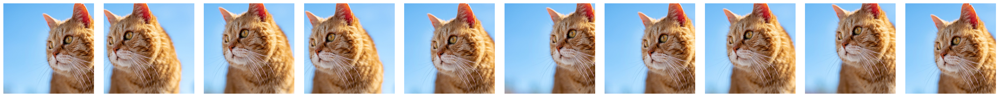

In [36]:
plt.figure(figsize=(30, 3))
col = 10
# 1행 10열의 서브플롯 생성
fig, axes = plt.subplots(1, col, figsize=(30, 3))

# 랜덤 크롭
for i in range(10):
    transform = A.Compose(
        [A.RandomCrop(width=256, height=256)]
    )
    transformed = transform(image=image_arr)
    # visualize(transformed['image'])
    
    # 서브플롯에 이미지 배치
    axes[i].imshow(transformed['image'])
    axes[i].axis('off')  # 축을 표시하지 않음

plt.tight_layout()
plt.show()

<Figure size 3000x300 with 0 Axes>

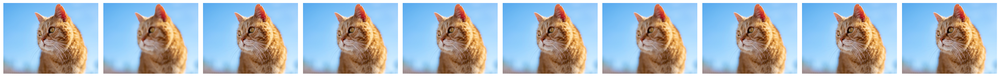

In [42]:
# 블러 처리
plt.figure(figsize=(30, 3))
col = 10
# 1행 10열의 서브플롯 생성
fig, axes = plt.subplots(1, col, figsize=(30, 3))

# 랜덤 크롭
for i in range(10):
    transform = A.Compose(
        [A.MedianBlur(blur_limit=7, always_apply=False, p=0.5)]
    )
    transformed = transform(image=image_arr)
    
    # 서브플롯에 이미지 배치
    axes[i].imshow(transformed['image'])
    axes[i].axis('off')  # 축을 표시하지 않음

plt.tight_layout()
plt.show()

<Figure size 500x500 with 0 Axes>

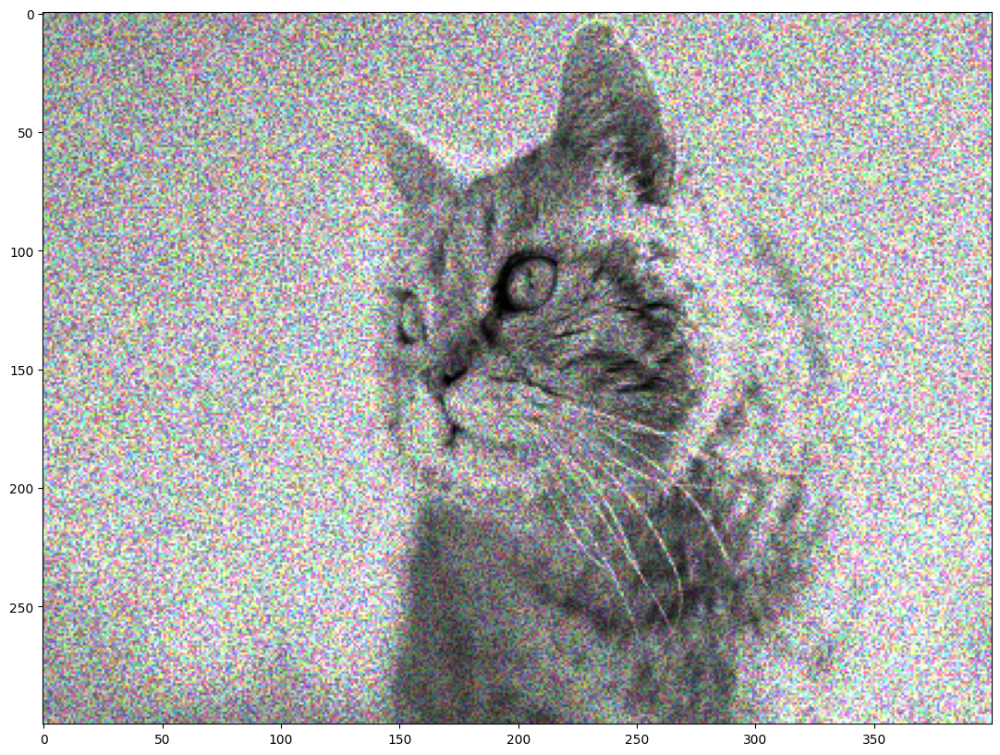

In [39]:
plt.figure(figsize=(5, 5))

# 동시에 여러개 적용하기 
transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1)]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

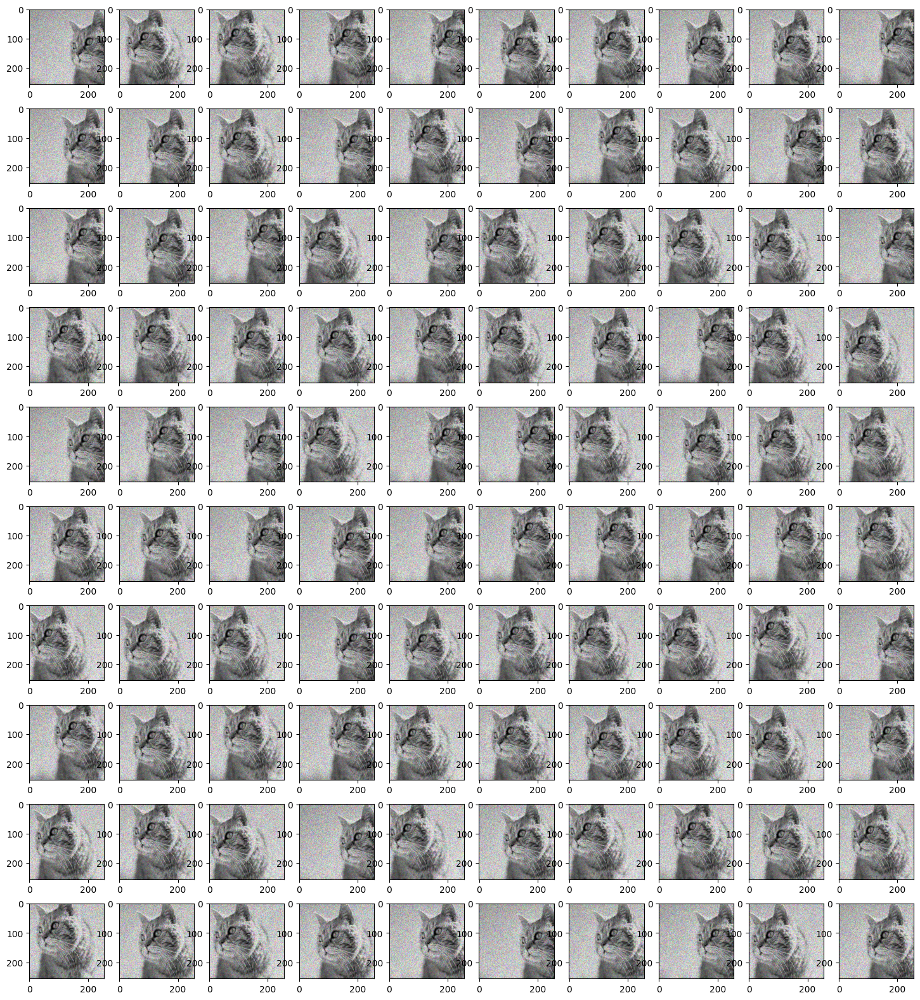

In [40]:
# Use various techniques and functions in albumentations library. show 100 images.
# 여기에 코드를 입력해 주세요.
def transform_data(img_arr):
    transform = A.Compose(
        [A.ToGray(p=1),
        A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1),
        A.RandomCrop(width=256, height=256)
        ]
    )
    t_image = transform(image=img_arr)
    t_image = t_image['image']
    return t_image

plt.figure(figsize=(18,20))
for i in range(100):
    image = transform_data(image_arr)
    plt.subplot(10,10,i+1)
    plt.imshow(image)